# Capstone Project - The Battle of the Neighborhoods (Week 2)
#### Applied Data Science Capstone by IBM/Coursera
## <u><center>Patterns in Types Of Restaurants in New York</center></u>


## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

The project aims to find out if there is any pattern in the type of restaurants located in every borough and neighborhood of New York.
 
 - Are some cuisines / types of restaurants more represented in certain areas than in others?
 - Which cuisines / types of restaurants have delivery options?
 - Is it possible to group neighborhoods together based on the sole criteria of food?
 - Which borough has the most restaurants?
 
The project will also focus on the borough with most restaurants in New York and provide a list of  top restaurants based on user ratings and likes and dine-out and delivery services considering current covid scenarios.


## Data <a name="data"></a>

Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segment the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the latitude and longitude coordinates of each neighborhood.

Following data sources will be needed to extract/generate the required information:
* Dataset for New York was dwonloaded from https://geo.nyu.edu/catalog/nyu_2451_34572
* Geopy library was used to get the latitude and longitude values of New York City. 
* Foursquare API was utilized to explore all the neighborhoods and segment them. The API was also used to get details of venue


In [1]:
{
    "tags": [
        "hide-input",
        "hide-output",
    ]
}
#hidden cell
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# !conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# !conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install folium
import folium # map rendering library
from folium.features import DivIcon
from folium import plugins

import matplotlib.pyplot as plt
import seaborn as sns

print('Libraries imported.')

     |████████████████████████████████| 112kB 13.3MB/s eta 0:00:01
Libraries imported.


#### Download and Explore Dataset


In [2]:
!wget -q -O 'newyork_data.json' https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json
print('Data downloaded!')

Data downloaded!


#### Load and explore the data
Next, let's load the data.


In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

All the relevant data is in the _features_ key, which is basically a list of the neighborhoods. So, let's define a new variable that includes this data.


In [4]:
neighborhoods_data = newyork_data['features']

#### Feature Selection
Lets look for first record

In [5]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

For the project only the following features were selected :
* borough -> Borough
* Name -> Neighborhood
* Coordinates -> Latitude, Longitude

#### Tranform the data into a _pandas_ dataframe


The next task is essentially transforming this data of nested Python dictionaries into a _pandas_ dataframe. 


In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Quickly examine the resulting dataframe.


In [7]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


And make sure that the dataset has all 5 boroughs and 306 neighborhoods.

In [8]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

neighborhoods.shape
neighborhoods['Borough'].unique()

The dataframe has 5 boroughs and 306 neighborhoods.


array(['Bronx', 'Manhattan', 'Brooklyn', 'Queens', 'Staten Island'],
      dtype=object)

#### Use geopy library to get the latitude and longitude values of New York City.


We will create a generic function to get latitude and longitude of requried address.

In [9]:
def getLatLon(address):
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    return location.latitude,location.longitude


In [10]:
NY_lat,NY_lon = getLatLon('New York City, NY')
print('The geograpical coordinate of New York City are {}, {}.'.format(NY_lat, NY_lon))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


#### Create a map of New York with neighborhoods superimposed on top.
Lets quickly visualize what data we collected so far

In [11]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[NY_lat, NY_lon], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

### Foursquare
Now that we have our location candidates, let's use Foursquare API to get info on restaurants in each neighborhood.

We're interested in venues in 'food' category, so we will fetch data specifying category id. We will only fetch required data.

Foursquare credentials are defined in hidden cell bellow.

In [12]:
{
    "tags": [
        "hide-input",
        "hide-output",
    ]
}

CLIENT_ID = '1Q2AVXMPVJ32NPAGX0VXUD5CM0BYLCF1I50AOBRFDGQJ34VW' # your Foursquare ID
CLIENT_SECRET = 'TTHMGMO3QHRCIC4TQ5VYXDFJAOU2DXBT41ACPQ1FUAAAEKZ0' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value


We will now specify the category of venues we want to fetch only required venue's data.

In [13]:
food_category = '4d4b7105d754a06374d81259' # 'Root' category for all food-related venues

In [14]:
def is_restaurant(category):
    restaurant_words = ['restaurant', 'diner', 'taverna', 'steakhouse']
    restaurant = False
    category_name = category.lower()
    for r in restaurant_words:
        if r in category_name:
            restaurant = True
    if 'fast food' in category_name:
            restaurant = False
    return restaurant

Next, define a function which fetch venues and returns a dataframe containing required attributes of a venue.

In [15]:
def getFoodVenues(names, latitudes, longitudes, radius=500):
    venues_list=[]
    venues_list.clear()
    venues_list_d=[]
    venues_list_d.clear()
    for name, lat, lng in zip(names, latitudes, longitudes):
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, food_category,
            radius, LIMIT)
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        v_name=None
        v_lat=None
        v_lng=None
        v_dis=None
        v_cat=None
        v_del='Not Avaliable'
        for v in results:
            is_res = is_restaurant(v['venue']['categories'][0]['name'])
            if is_res:
                v_name=v['venue']['name']
                v_lat=v['venue']['location']['lat']
                v_lng=v['venue']['location']['lng']
#                 v_dis=v['venue']['location']['distance']
                v_cat=v['venue']['categories'][0]['name']
                if 'delivery' in  v['venue']:
                    v_del= 'Available'
                venues_list.append([(name, lat, lng,v_name,v_lat,v_lng,
#                                      v_dis,
                                     v_cat,v_del)])
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
#                   'Venue Distance',
                  'Venue Category','Venue Delivery']

    return(nearby_venues)


In [16]:
NY_FOOD_VENUES=getFoodVenues(names=neighborhoods['Neighborhood'],latitudes=neighborhoods['Latitude'],longitudes=neighborhoods['Longitude'])

Let's check the data of food venues

In [18]:
NY_FOOD_VENUES.shape

(4252, 9)

Next, we will add Borough column for further analysis.

In [19]:
NY_FOOD_VENUES=pd.merge(NY_FOOD_VENUES,neighborhoods, on=['Neighborhood','Latitude','Longitude'])
NY_FOOD_VENUES.head()

,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category,Venue Delivery,Borough
0,Eastchester,40.887556,-73.827806,Cozy Cottage Restaurant,40.886332,-73.827616,137,Diner,Available,Bronx
1,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,241,Caribbean Restaurant,Available,Bronx
2,Eastchester,40.887556,-73.827806,Dyre Fish Market,40.889318,-73.831453,364,Seafood Restaurant,Available,Bronx
3,Eastchester,40.887556,-73.827806,Golden Krust Caribbean Restaurant,40.888488,-73.831083,294,Caribbean Restaurant,Available,Bronx
4,Eastchester,40.887556,-73.827806,Xing Lung Chinese Restaurant,40.888785,-73.831226,318,Chinese Restaurant,Available,Bronx


Lets find out total no. of restaurants in New York and average restaurants per neighborhood.

In [20]:
import numpy as np
print('Total number of restaurants:', len(NY_FOOD_VENUES))
print('Average number of restaurants in neighborhood:', np.array([len(r) for r in NY_FOOD_VENUES]).mean())

Total number of restaurants: 2119
Average number of restaurants in neighborhood: 11.2


### Data Cleaning

We're interested in restaurants, so we will discard data with categories like diner, restaurants etc

In [21]:
NY_FOOD_VENUES = NY_FOOD_VENUES[NY_FOOD_VENUES['Venue Category'].isin(['Restaurant','Food','Diner']) == False]

In [22]:
import numpy as np
print('Total number of restaurants:', len(NY_FOOD_VENUES))
print('Average number of restaurants in neighborhood:', np.array([len(r) for r in NY_FOOD_VENUES]).mean())

Total number of restaurants: 1977
Average number of restaurants in neighborhood: 11.2


In [23]:
NY_FOOD_VENUES.head()

,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category,Venue Delivery,Borough
1,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,241,Caribbean Restaurant,Available,Bronx
2,Eastchester,40.887556,-73.827806,Dyre Fish Market,40.889318,-73.831453,364,Seafood Restaurant,Available,Bronx
3,Eastchester,40.887556,-73.827806,Golden Krust Caribbean Restaurant,40.888488,-73.831083,294,Caribbean Restaurant,Available,Bronx
4,Eastchester,40.887556,-73.827806,Xing Lung Chinese Restaurant,40.888785,-73.831226,318,Chinese Restaurant,Available,Bronx
6,Eastchester,40.887556,-73.827806,Royal Caribbean Bakery,40.888249,-73.831661,333,Caribbean Restaurant,Available,Bronx


Looking good. So now we have all the restaurants data! We also know which restaurants exactly are in vicinity of every neighborhood and borough.

This concludes the data gathering phase - we're now ready to use this data for analysis to produce the report on the density and types of restaurants in New York and detailed venues based on user ratings and likes.

## Methodology <a name="methodology"></a>

In this project we will direct our efforts on detecting patterns in the type of restaurants located in every borough and neighborhood of New York. We will limit our analysis to area 500m radius.

In first step we have collected the required **data: location and type (category) of every restaurant within 500m radius**. 

Second step in our analysis will be calculation and exploration of '**restaurant density**' across different areas of New York. We will also explore the borough with most restaurants in New York and provide a list of  top restaurants based on user ratings and likes and dine-out and delivery services considering current covid scenarios

In third and final step we will focus **clustering neighborhoods and borough** based on types of restaurants. We will present map of all such locations but also create clusters (using **k-means clustering**) to derive conclusions discussed in the problem section.

## Analysis <a name="analysis"></a>

Let's perform some basic explanatory data analysis and derive some additional info from our raw data. First let's calculate the **density of restaurants in every borough and neighborhood and plot the same**:

### 1. Density of restaurants in New York

#### Restaurant density in each borough

In [62]:
B_Res_Density=pd.DataFrame(NY_FOOD_VENUES.groupby('Borough')['Borough'].count().reset_index(drop=False,name='Count'))
B_Res_Density.head()

,Borough,Count
0,Bronx,165
1,Brooklyn,488
2,Manhattan,870
3,Queens,328
4,Staten Island,126


In [25]:
B_Res_Density['Longitude']=0
B_Res_Density['Latitude']=0
# define a moethod to add latitude and longitude for boroughs
def setLatLon(names):
    for name in names:
        lat,lon = getLatLon(name)
        B_Res_Density.loc[B_Res_Density.Borough == name, 'Latitude'] =lat
        B_Res_Density.loc[B_Res_Density.Borough == name, 'Longitude'] =lon
        

In [89]:
setLatLon(B_Res_Density.Borough)
B_Res_Density.head()

,Borough,Count,Latitude,Longitude
0,Bronx,165,40.846651,-73.878594
1,Brooklyn,488,40.650102,-73.949583
2,Manhattan,870,40.789624,-73.959894
3,Queens,328,40.749824,-73.797634
4,Staten Island,126,40.583456,-74.149605


Get the shape file for boroughs

In [27]:
ny_bor_geo = r'BoroughBoundaries.geojson'

Using folium map to visualize density

In [28]:
nyc_b_density_map = folium.Map(location=[NY_lat, NY_lon], zoom_start=10)

threshold_scale = np.linspace(B_Res_Density['Count'].min(),
                              B_Res_Density['Count'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum 

# generate choropleth map 
nyc_b_density_map.choropleth(
    geo_data=ny_bor_geo,
    data=B_Res_Density,
    columns=['Borough', 'Count'],
    key_on='feature.properties.boro_name',
    threshold_scale=threshold_scale,
    fill_color='PuRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Food Venues'
)

# add markers to map
for lat, lng, label in zip(B_Res_Density['Latitude'], B_Res_Density['Longitude'], B_Res_Density['Borough']):
    folium.Marker(
        [lat, lng],
        icon=DivIcon(icon_size=(150,36),icon_anchor=(0,0),html='<div style="font-size: 10pt"><b>%s</div>' % label,
        )
    ).add_to(nyc_b_density_map)  

folium.TileLayer('cartodbpositron').add_to(nyc_b_density_map)

# display map
nyc_b_density_map

<center><u>Density of food venues in each Borough

From above map it is clear that **Manhattan** has a large number of food venues in New York

#### Restaurant density in each neighborhood

In [29]:
N_Res_Density=pd.DataFrame(NY_FOOD_VENUES.groupby('Neighborhood')['Neighborhood'].count())
N_Res_Density.columns=['Count']
N_Res_Density.reset_index(inplace=True)
N_Res_Density=N_Res_Density[N_Res_Density['Count']>=5].reset_index(drop=True)
N_Res_Density.head()

,Neighborhood,Count
0,Allerton,5
1,Astoria,49
2,Astoria Heights,5
3,Battery Park City,8
4,Bay Ridge,42


In [30]:
# create dataframe for popup name of neighbrohoods with most dense restaurant areas
NY_RES_POPUP=N_Res_Density[N_Res_Density['Count']>60].reset_index(drop=True)
NY_RES_POPUP =pd.merge(NY_RES_POPUP,neighborhoods[['Neighborhood','Latitude','Longitude']], on=['Neighborhood'])
NY_RES_POPUP.head()

,Neighborhood,Count,Latitude,Longitude
0,Chinatown,74,40.715618,-73.994279
1,Greenwich Village,72,40.726933,-73.999914
2,Little Italy,65,40.719324,-73.997305
3,Midtown South,62,40.748510,-73.988713
4,Murray Hill,76,40.748303,-73.978332


Get the shape file for neighborhoods

In [31]:
ny_ne_geo = r'NY_NEIGH_BOUND.json' 

Using folium map to visualize density

In [32]:
nyc_n_density_map = folium.Map(location=[NY_lat, NY_lon], zoom_start=10)

threshold_scale = np.linspace(N_Res_Density['Count'].min(),
                              N_Res_Density['Count'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum 
# print(threshold_scale)

# generate choropleth map 
nyc_n_density_map.choropleth(
    geo_data=ny_ne_geo,
    data=N_Res_Density,
    columns=['Neighborhood', 'Count'],
    key_on='feature.properties.neighborhood',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=2.0, 
    line_opacity=0.2,
    legend_name='Total Food Venues'
)
folium.TileLayer('cartodbpositron').add_to(nyc_n_density_map)
# display map
nyc_n_density_map


<center><u>Density of food venues in each Neighborhood

For exploring neighborhoods according to density we can visualize in a better way through below map

In [33]:
sm= NY_FOOD_VENUES[['Neighborhood','Latitude','Longitude','Venue Category']]
sm.columns=['Neighborhood','NLatitude','NLongitude','Category']
sm.head()

,Neighborhood,NLatitude,NLongitude,Category
1,Eastchester,40.887556,-73.827806,Caribbean Restaurant
2,Eastchester,40.887556,-73.827806,Seafood Restaurant
3,Eastchester,40.887556,-73.827806,Caribbean Restaurant
4,Eastchester,40.887556,-73.827806,Chinese Restaurant
6,Eastchester,40.887556,-73.827806,Caribbean Restaurant


In [34]:
ny_map = folium.Map(location = [NY_lat, NY_lon], zoom_start = 10
                        )
folium.GeoJson(
    ny_bor_geo,
    name='geojson'
).add_to(ny_map)

# folium.GeoJson(
#     ny_ne_geo,
#     name='geojson'
# ).add_to(ny_map)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(ny_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(sm['NLatitude'], sm['NLongitude'],sm['Category']):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# add markers to map
for lat, lng, label in zip(B_Res_Density['Latitude'], B_Res_Density['Longitude'], B_Res_Density['Borough']):
    folium.Marker(
        [lat, lng],
        icon=DivIcon(icon_size=(150,36),icon_anchor=(0,0),html='<div style="font-size: 10pt"><b>%s</div>' % label,
        )
    ).add_to(ny_map)  

# display map
ny_map

<center><u>Visualize restaurants based on density in New York

In above map you can view the density of restaurants in form of numbers. The number represent how dense the area is. As you zoom in the counts will be divided into smaller areas and finally the address of restaurnts.

### 2. Top 10 categories of restaurants based on density

Now we will find the top 10 categories of restaurants in New York based on density and then we will analyze each borough to view is there any relation between the boroughs based on type of restaurants.

In [35]:
print('There are {} unique categories of restaurants in New York'.format(len(pd.unique(NY_FOOD_VENUES['Venue Category']))))

There are 83 unique categories of restaurants in New York


In [36]:
venue_counts=pd.DataFrame(NY_FOOD_VENUES.groupby(['Venue Category'])['Venue'].count()).reset_index(drop=False)
venue_counts=venue_counts.sort_values(by=['Venue'],ascending=False).reset_index(drop=True)
venue_counts=venue_counts.head(10)
venue_counts

,Venue Category,Venue
0,Chinese Restaurant,253
1,Italian Restaurant,220
2,Mexican Restaurant,166
3,American Restaurant,145
4,Korean Restaurant,83
5,Sushi Restaurant,80
6,Japanese Restaurant,76
7,Thai Restaurant,68
8,Caribbean Restaurant,63
9,Indian Restaurant,56


From the above list we get the top 10 restaurant category or type in New York. Now lets check if there are relation between boroughs based on the above top 10 categories

In [37]:
threshold=[i in set(venue_counts['Venue Category'])for i in NY_FOOD_VENUES['Venue Category']]
s=NY_FOOD_VENUES[threshold]
s.head()
BOR_CAT_RES_DENSITY=pd.DataFrame(s.groupby(['Borough','Venue Category'])['Venue'].count()).reset_index(drop=False)
# BOR_CAT_RES_DENSITY=BOR_CAT_RES_DENSITY.sort_values(by=['Borough','Venue'],ascending=False).reset_index(drop=True)
BOR_CAT_RES_DENSITY
res = pd.DataFrame(BOR_CAT_RES_DENSITY.pivot(index='Venue Category', columns='Borough', values='Venue')).reset_index()
res


Borough,Venue Category,Bronx,Brooklyn,Manhattan,Queens,Staten Island
0,American Restaurant,8.0,39.0,71.0,7.0,20.0
1,Caribbean Restaurant,9.0,31.0,13.0,9.0,1.0
2,Chinese Restaurant,50.0,62.0,74.0,52.0,15.0
3,Indian Restaurant,2.0,12.0,29.0,11.0,2.0
4,Italian Restaurant,14.0,41.0,119.0,18.0,28.0
5,Japanese Restaurant,2.0,18.0,39.0,14.0,3.0
6,Korean Restaurant,NaN,6.0,38.0,39.0,NaN
7,Mexican Restaurant,27.0,49.0,52.0,23.0,15.0
8,Sushi Restaurant,1.0,19.0,38.0,12.0,10.0
9,Thai Restaurant,2.0,19.0,31.0,14.0,2.0


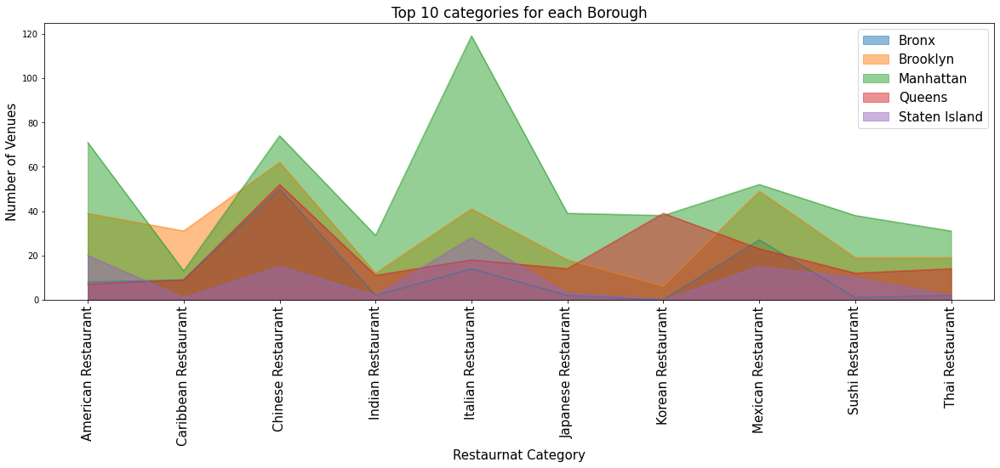

In [63]:
res.plot(kind='area', 
             stacked=False,
             figsize=(20, 6), # pass a tuple (x, y) size
             )

plt.title('Top 10 categories for each Borough', fontsize=17)
plt.ylabel('Number of Venues', fontsize=15)
plt.xlabel('Restaurnat Category', fontsize=15)
plt.xticks(rotation = 90)
plt.xticks(np.arange(10), (res['Venue Category']),fontsize=15)
plt.legend(prop={'size': 15})
plt.show()

From the above area plot we can conclude that :
 - In **Manhattan most popular are Italian restaurant**
 - ALL the  Boroughs has almost **equal popularity for Chinese Restaurants**
 - **Brooklyn, Manhattan, Queens have almost similar popularity** in types of restaurants

### 3. Restaurants density based on delivery options

In [39]:
print('{} restaurants provide food delivery in New York.'.format(len(NY_FOOD_VENUES[NY_FOOD_VENUES['Venue Delivery']=='Available'])))

1794 restaurants provide food delivery in New York.


Most of the restaurants provide home delivery options in New York so if you are too tired to go out or you have safety concerns then you can just ask for home delivery from the restaurant of your choice.

The below function list and display all the restaurants in a neighborhood which provide home delivery option you just need to pass the name of neighborhood and borough.


In [40]:
NY_DEL_VENUES=NY_FOOD_VENUES[NY_FOOD_VENUES['Venue Delivery']=='Available']
NY_DEL_VENUES.head(10)
# NY_DEL_VENUES[NY_DEL_VENUES['Borough']=='Queens']

,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Distance,Venue Category,Venue Delivery,Borough
1,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,241,Caribbean Restaurant,Available,Bronx
2,Eastchester,40.887556,-73.827806,Dyre Fish Market,40.889318,-73.831453,364,Seafood Restaurant,Available,Bronx
3,Eastchester,40.887556,-73.827806,Golden Krust Caribbean Restaurant,40.888488,-73.831083,294,Caribbean Restaurant,Available,Bronx
4,Eastchester,40.887556,-73.827806,Xing Lung Chinese Restaurant,40.888785,-73.831226,318,Chinese Restaurant,Available,Bronx
6,Eastchester,40.887556,-73.827806,Royal Caribbean Bakery,40.888249,-73.831661,333,Caribbean Restaurant,Available,Bronx
13,Norwood,40.877224,-73.879391,Queen of Tacos,40.880200,-73.883434,474,Mexican Restaurant,Available,Bronx
15,Norwood,40.877224,-73.879391,Golden Krust Caribbean Restaurant,40.881672,-73.878996,496,Caribbean Restaurant,Available,Bronx
16,Norwood,40.877224,-73.879391,El Presidente II,40.880516,-73.883233,488,Spanish Restaurant,Available,Bronx
17,Norwood,40.877224,-73.879391,Mar y Tierra Restaurant and Lounge,40.876705,-73.879532,58,Mexican Restaurant,Available,Bronx
18,Norwood,40.877224,-73.879391,Panda House,40.875102,-73.879803,238,Chinese Restaurant,Available,Bronx


In [41]:
neighborhood_name='Astoria'
borough_name='Queens'

In [42]:
def get_res_list(neighborhood_name,borough_name):
    print('Restaurant list:')
    for i in NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue']:
        print(' ->',i,end=' ->') 
    name=neighborhood_name+','+borough_name
    nlat,nlon=getLatLon(name)
    ny_del_map = folium.Map(location = [nlat,nlon], zoom_start = 15)
    folium.GeoJson(
        ny_ne_geo,
        name='geojson'
    ).add_to(ny_del_map)

#     # instantiate a mark cluster object for the incidents in the dataframe
#     incidents = plugins.MarkerCluster().add_to(ny_del_map)

#     # loop through the dataframe and add each data point to the mark cluster
#     for lat, lng, label, in zip(NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue Latitude'], 
#                                 NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue Longitude'],
#                                 NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue']):
#         folium.Marker(
#             location=[lat, lng],
#             icon=None,
#             popup=label,
#         ).add_to(incidents)
    for lat, lng, venue in zip(NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue Latitude'], 
                                NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue Longitude'],
                                NY_DEL_VENUES.loc[NY_DEL_VENUES['Neighborhood']==neighborhood_name,'Venue']):
        label = venue
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(ny_del_map)  
 
    # add markers to map
    for lat, lng, label in zip(B_Res_Density['Latitude'], B_Res_Density['Longitude'], B_Res_Density['Borough']):
        folium.Marker(
            [lat, lng],
            icon=DivIcon(icon_size=(150,36),icon_anchor=(0,0),html='<div style="font-size: 10pt"><b>%s</div>' % label,
            )
        ).add_to(ny_del_map)  
    folium.Marker(
            [nlat,nlon],
            icon=DivIcon(icon_size=(150,36),icon_anchor=(0,0),html='<div style="font-size: 10pt"><b>%s</div>' % name,
            )
        ).add_to(ny_del_map)  
    # display map
    return ny_del_map

In [43]:
ny_del_map=get_res_list(neighborhood_name,borough_name)
ny_del_map

Restaurant list:
 -> Favela Grill -> -> Off The Hook -> -> Al-sham Sweets and Pastries -> -> The Gully -> -> AbuQir Seafood -> -> Duzan -> -> Sabry's -> -> Seva Indian Cuisine -> -> Viva Viva -> -> Crave Astoria -> -> Mochiron Izakaya -> -> El Cafetal -> -> Tikka Indian Grill -> -> Ovelia Psistaria Bar -> -> Pochana Thai Kitchen -> -> Kabab Café -> -> Jujube Tree -> -> The Grand -> -> Antika Restaurant & Pizzeria -> -> King of Falafel and Shawarma -> -> Kal -> -> Sugar Freak -> -> Farid Kebab, Steinway -> -> Gyro Uno -> -> Mombar -> -> Gyro World -> -> El Omda -> -> Queens Comfort -> -> Blend Astoria -> -> Elias Corner For Fish -> -> Halal Sandwich Shop -> -> Layali Dubai -> -> Via Trenta -> -> Pink Nori -> -> El-Rawsheh -> -> Golden House Chinese Restaurant -> -> Sampan -> -> Aden Restaurant -> -> Matsu Sushi -> -> Piatsa Souvlaki -> -> Pita Pan -> -> Namaste -> -> Golden Kitchen -> -> Little Morocco -> -> Mijana Hookah Lounge & Restaurant -> -> Avenue A -> -> AwesomeSauce -> -> Tikka

Looking good. What we have now is just list and location of all the restaurants in that neighborhood.

Let us now **cluster** New York venues to find out if there is any pattern in types of restaurants in neighborhoods.

### Modeling (k-means clustering)

**Analyze each neighborhood**

In [44]:
NY_VENUE_NEIGH_COUNT=NY_FOOD_VENUES.groupby('Neighborhood').count()[['Venue']].sort_values(by=['Venue'],ascending=False)
NY_VENUE_NEIGH_COUNT.reset_index(inplace=True)
NY_VENUE_NEIGH_COUNT.describe()

,Venue
count,134.000000
mean,14.753731
std,18.028147
min,1.000000
25%,3.000000
50%,7.500000
75%,17.750000
max,76.000000


Average venues=14.71, 25% of neighborhoods host less than 3 places. The most represented neighborhood in our data set counts 76 restaurants.
Looking good. 

#### Feature Engineering

Now, each neighborhood is analyzed individually to understand the most common cuisine being served within its 500 meters of the vicinity.
The above process is taken forth by using ‘one hot encoding’ function of python ‘pandas’ library. One hot encoding converts the categorical variables (which are ‘Venue Category’) into a form that could be provided to ML algorithms to do a better job in prediction.

In [90]:
# one hot encoding
n_onehot = pd.get_dummies(NY_FOOD_VENUES[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
n_onehot['Neighborhood'] = NY_FOOD_VENUES['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [n_onehot.columns[-1]] + list(n_onehot.columns[:-1])
n_onehot = n_onehot[fixed_columns]

n_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Himalayan Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Paella Restaurant,Pakistani Restaurant,Peking Duck Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Romanian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
1,Eastchester,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Eastchester,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Eastchester,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Eastchester,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Eastchester,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [91]:
n_onehot.shape

(1977, 84)

Upon converting the categorical variables, as shown above, ‘Neighborhood’ column is added back. The size of the new dataframe ‘nyc_onehot’ is examined and it is found that there are around 1977 data points altogether.

In [92]:
# Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
n_grouped = n_onehot.groupby('Neighborhood').mean().reset_index()

# Let's store each neighborhood along with the top 5 most common venues in a dateframe
#funtion to sort values in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]
n_grouped.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Himalayan Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Paella Restaurant,Pakistani Restaurant,Peking Duck Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Romanian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
0,Allerton,0.0,0.0,0.20,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.400000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.200000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.2,0.000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
1,Annadale,0.0,0.0,0.75,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.250000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
2,Astoria,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.020408,0.020408,0.0,0.0,0.0,0.061224,0.020408,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020408,0.0,0.0,0.0,0.0,0.122449,0.020408,0.0,0.0,0.0,0.102041,0.0,0.0,0.040816,0.040816,0.0,0.0,0.020408,0.0,0.020408,0.0,0.0,0.081633,0.040816,0.183673,0.0,0.0,0.020408,0.020408,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.081633,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.020408,0.0,0.0,0.0,0.0,0.0,0.020408,0.0,0.0,0.0,0.020408,0.0,0.0
3,Astoria Heights,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.400000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.600000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
4,Battery Park City,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.375000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.125000,0.125000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.125000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125000,0.0,0.0,0.0,0.0,0.0,0.0,0.125,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0


In [93]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = n_grouped['Neighborhood']

for ind in np.arange(n_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(n_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Allerton,Chinese Restaurant,American Restaurant,Mexican Restaurant,Spanish Restaurant,Vietnamese Restaurant
1,Annadale,American Restaurant,Sushi Restaurant,Vietnamese Restaurant,Ethiopian Restaurant,Falafel Restaurant
2,Astoria,Middle Eastern Restaurant,Greek Restaurant,Indian Restaurant,Seafood Restaurant,Mediterranean Restaurant
3,Astoria Heights,Italian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Halal Restaurant,Ethiopian Restaurant
4,Battery Park City,Chinese Restaurant,Steakhouse,Japanese Restaurant,Italian Restaurant,Seafood Restaurant


In [94]:
n_grouped_clustering = n_grouped.drop('Neighborhood', 1)

#### Cluster Nieghborhoods:

**k-means’** is an unsupervised machine learning algorithm which creates clusters of data points aggregated together because of certain similarities. This algorithm will be used to count neighborhoods for each cluster label for variable cluster size.

To implement this algorithm, it is very important to determine the optimal number of clusters (i.e. k). 
We will use **‘The Elbow Method’** to know the same.

**The Elbow Method** 
The Elbow Method calculates the sum of squared distances of samples to their closest cluster center for different values of ‘k’. The optimal number of clusters is the value after which there is no significant decrease in the sum of squared distances.

Following is an implementation of this method (with varying number of clusters from 1 to 20):

In [50]:
sum_of_squared_distances = []
KCluster=range(1,20)
for k in KCluster:
    print(k,end=' ')
    kmeans=KMeans(n_clusters=k).fit(n_grouped_clustering)
    sum_of_squared_distances.append(kmeans.inertia_)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

Text(0.5, 1.0, 'Elbow Method for optimal k')

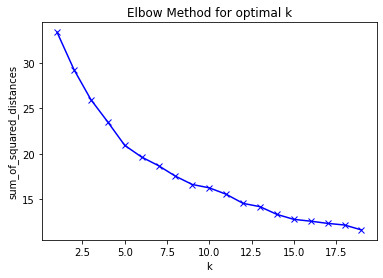

In [51]:
plt.plot(KCluster,sum_of_squared_distances,'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances')
plt.title('Elbow Method for optimal k')

Elbow method does not seem to help us to determine the optimal number of clusters. Let's use another method.

The Silhouette Method - The silhouette value measures how similar a point is to its own cluster (cohesion) compared to other clusters (separation). Source: Wikipedia

In [66]:
from sklearn.metrics import silhouette_score

sil = []
K_sil = range(2,20)
# minimum 2 clusters required, to define dissimilarity
for k in K_sil:
    print(k, end=' ')
    kmeans = KMeans(n_clusters = k).fit(n_grouped_clustering)
    labels = kmeans.labels_
    sil.append(silhouette_score(n_grouped_clustering, labels, metric = 'euclidean'))

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

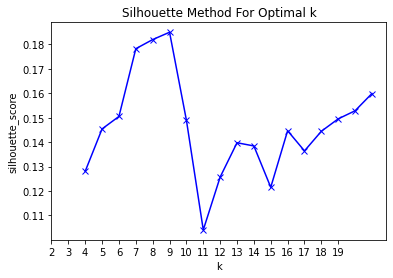

In [67]:
plt.plot(K_sil, sil, 'bx-')
plt.xticks(np.arange(18), (range(2,20)),fontsize=10)
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method For Optimal k')
plt.show()

There is a peak at k = 9 and k = 14. Two and four clusters will give a very broad classification of the venues.

Let's set number of clusters = 9

<span style="color:blue"><b>Run _k_-means to cluster the neighborhood into 9 clusters</span>

In [95]:
kclusters = 9

kmeans = KMeans(init="k-means++", n_clusters=kclusters, n_init=50).fit(n_grouped_clustering)

print(kmeans.labels_)

[7 3 2 0 7 2 5 8 7 7 7 7 7 2 7 7 8 2 2 0 2 7 5 2 8 2 2 7 8 1 8 0 2 2 1 5 5
 8 1 4 0 2 1 7 8 5 2 2 3 7 2 4 8 7 2 2 7 2 2 3 8 0 7 0 2 2 5 8 8 6 2 1 2 0
 7 2 8 7 8 0 7 8 2 7 7 2 2 7 2 2 7 2 5 2 2 7 2 2 0 7 5 4 2 0 8 7 2 1 0 7 2
 2 8 7 3 2 2 2 7 3 2 8 5 0 5 2 7 2 8 8 5 2 2 8]


In [96]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# merge New york data with venue data to add latitude/longitude for each neighborhood
neigh_merged = pd.merge(neighborhoods,neighborhoods_venues_sorted, on='Neighborhood')
neigh_merged.head() # check the last columns!

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bronx,Eastchester,40.887556,-73.827806,1,Caribbean Restaurant,Seafood Restaurant,Chinese Restaurant,Vietnamese Restaurant,Empanada Restaurant
1,Manhattan,Marble Hill,40.876551,-73.910660,7,Chinese Restaurant,American Restaurant,Seafood Restaurant,Steakhouse,Vietnamese Restaurant
2,Bronx,Norwood,40.877224,-73.879391,7,Chinese Restaurant,American Restaurant,Mexican Restaurant,Spanish Restaurant,Caribbean Restaurant
3,Bronx,Baychester,40.866858,-73.835798,5,American Restaurant,Mexican Restaurant,Spanish Restaurant,Vietnamese Restaurant,Halal Restaurant
4,Bronx,Bedford Park,40.870185,-73.885512,8,Mexican Restaurant,Chinese Restaurant,Spanish Restaurant,Italian Restaurant,Vietnamese Restaurant


In [97]:
# create map
map_clusters = folium.Map(location=[NY_lat,NY_lon], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []

folium.GeoJson(
    ny_bor_geo,
    name='geojson'
).add_to(map_clusters)

for lat, lon, poi, cluster in zip(neigh_merged['Latitude'], neigh_merged['Longitude'], neigh_merged['Neighborhood'], neigh_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3.5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
    
# add markers to map
for lat, lng, label in zip(B_Res_Density['Latitude'], B_Res_Density['Longitude'], B_Res_Density['Borough']):
    folium.Marker(
        [lat, lng],
        icon=DivIcon(icon_size=(150,36),icon_anchor=(0,0),html='<div style="font-size: 10pt"><b>%s</div>' % label,
        )
    ).add_to(map_clusters)  

folium.TileLayer('cartodbpositron').add_to(map_clusters)

map_clusters

Let's analyze the clusters to find if there are any simlarity between the neighborhoods based on types of food.

First lets create a dataframe for 1st and 2nd most common venues.

In [98]:
first=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','1st Most Common Venue'])['Neighborhood'].count().reset_index(drop=False,name='Count'))
first=first.sort_values(by=['Cluster Labels','Count'],ascending=False)
first =first.groupby(['Cluster Labels']).apply(lambda x: x.nlargest(1,['Count'])).reset_index(drop=True)
first

,Cluster Labels,1st Most Common Venue,Count
0,0,Italian Restaurant,10
1,1,Caribbean Restaurant,4
2,2,Italian Restaurant,15
3,3,American Restaurant,5
4,4,Seafood Restaurant,2
5,5,Spanish Restaurant,4
6,6,Indian Restaurant,1
7,7,Chinese Restaurant,22
8,8,Mexican Restaurant,13


In [99]:
ng=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','1st Most Common Venue'])['Neighborhood'].apply(','.join)).reset_index(drop=False)
bo=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','1st Most Common Venue']).apply(lambda x: x['Borough'].unique())).reset_index(drop=False)
first_merged=pd.merge(first,ng,on=('Cluster Labels','1st Most Common Venue'))
first_merged=pd.merge(first_merged,bo,on=('Cluster Labels','1st Most Common Venue'))
first_merged=first_merged.rename(columns={0:'Borough'})
first_merged

,Cluster Labels,1st Most Common Venue,Count,Neighborhood,Borough
0,0,Italian Restaurant,10,"Country Club,Pelham Bay,Tottenville,Old Town,C...","[Bronx, Staten Island, Queens, Brooklyn]"
1,1,Caribbean Restaurant,4,"Eastchester,Laurelton,Remsen Village,Erasmus","[Bronx, Queens, Brooklyn]"
2,2,Italian Restaurant,15,"North Riverdale,Bay Ridge,Cobble Hill,Fort Gre...","[Bronx, Brooklyn, Manhattan, Staten Island, Qu..."
3,3,American Restaurant,5,"Sunnyside,Sunnyside,Grymes Hill,Annadale,Silve...","[Queens, Staten Island]"
4,4,Seafood Restaurant,2,"Gerritsen Beach,Edgemere","[Brooklyn, Queens]"
5,5,Spanish Restaurant,4,"Fordham,East Tremont,Travis,Westerleigh","[Bronx, Staten Island]"
6,6,Indian Restaurant,1,Jamaica Estates,[Queens]
7,7,Chinese Restaurant,22,"Marble Hill,Norwood,Melrose,Olinville,Concours...","[Manhattan, Bronx, Brooklyn, Queens, Staten Is..."
8,8,Mexican Restaurant,13,"Bedford Park,Westchester Square,Bushwick,East ...","[Bronx, Brooklyn, Manhattan, Queens, Staten Is..."


Above data represents data of each cluster with the first most common venue and the corresponding neighborhoods and boroughs that contain those categories of venue. Like in CLuster 0 the most common category is Italian Restaurant and the neighborhoods that have restaurants in the same category are Country Club, Pelham Bay, Tottenville etc.

In [100]:
second=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','2nd Most Common Venue'])['Neighborhood'].count().reset_index(drop=False,name='Count'))
second=second.sort_values(by=['Cluster Labels','Count'],ascending=False)
second =second.groupby(['Cluster Labels']).apply(lambda x: x.nlargest(1,['Count'])).reset_index(drop=True)
second

,Cluster Labels,2nd Most Common Venue,Count
0,0,Chinese Restaurant,3
1,1,Caribbean Restaurant,2
2,2,American Restaurant,8
3,3,Mexican Restaurant,2
4,4,Asian Restaurant,1
5,5,Spanish Restaurant,3
6,6,Vietnamese Restaurant,1
7,7,Chinese Restaurant,6
8,8,Mexican Restaurant,6


In [101]:
ng=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','2nd Most Common Venue'])['Neighborhood'].apply(','.join)).reset_index(drop=False)
bo=pd.DataFrame(neigh_merged.groupby(['Cluster Labels','2nd Most Common Venue']).apply(lambda x: x['Borough'].unique())).reset_index(drop=False)
second_merged=pd.merge(second,ng,on=('Cluster Labels','2nd Most Common Venue'))
second_merged=pd.merge(second_merged,bo,on=('Cluster Labels','2nd Most Common Venue'))
second_merged=second_merged.rename(columns={0:'Borough'})
second_merged

,Cluster Labels,2nd Most Common Venue,Count,Neighborhood,Borough
0,0,Chinese Restaurant,3,"Country Club,Pelham Bay,Astoria Heights","[Bronx, Queens]"
1,1,Caribbean Restaurant,2,"East Flatbush,Coney Island",[Brooklyn]
2,2,American Restaurant,8,"Fort Greene,Downtown,North Side,Clinton,Chelse...","[Brooklyn, Manhattan, Staten Island]"
3,3,Mexican Restaurant,2,"Sunnyside,Sunnyside","[Queens, Staten Island]"
4,4,Asian Restaurant,1,Edgemere,[Queens]
5,5,Spanish Restaurant,3,"East New York,Ozone Park,North Corona","[Brooklyn, Queens]"
6,6,Vietnamese Restaurant,1,Jamaica Estates,[Queens]
7,7,Chinese Restaurant,6,"Longwood,Hollis,Rochdale,Lindenwood,Rossville,...","[Bronx, Queens, Staten Island]"
8,8,Mexican Restaurant,6,"Sunset Park,Flatbush,Prospect Park South,Lower...","[Brooklyn, Manhattan, Queens]"


Above data represents data of each cluster with the second most common venue and the corresponding neighborhoods and boroughs that contain those categories of venue. Like in CLuster 0 the most common category is Chinese Restaurant and the neighborhoods that have restaurants in the same category are Country club, Pelham Bay, Astoria heights.

In [102]:
cluster_merged=pd.merge(first,second,on=('Cluster Labels'))
cluster_merged

,Cluster Labels,1st Most Common Venue,Count_x,2nd Most Common Venue,Count_y
0,0,Italian Restaurant,10,Chinese Restaurant,3
1,1,Caribbean Restaurant,4,Caribbean Restaurant,2
2,2,Italian Restaurant,15,American Restaurant,8
3,3,American Restaurant,5,Mexican Restaurant,2
4,4,Seafood Restaurant,2,Asian Restaurant,1
5,5,Spanish Restaurant,4,Spanish Restaurant,3
6,6,Indian Restaurant,1,Vietnamese Restaurant,1
7,7,Chinese Restaurant,22,Chinese Restaurant,6
8,8,Mexican Restaurant,13,Mexican Restaurant,6


## Results and Discussion <a name="results"></a>


Our analysis shows that there are a great number of restaurants in New York and Manhattan has the largest number of restaurants among all boroughs. The people of Manhattan love Italian food. We also found out that there are 83 types of food category/cuisines in New York among which the top 10 based on density are : Chinese, Italian, Mexican, American, Korean, Sushi, Japanese, Thai, Caribbean and Indian. 
Most of the restaurants provide food delivery options so if you want to grab a bite from the comfort of your own place then you can just ask for home delivery. 
Then we clustered  the neighborhood data to find out if there is any relation between the neighborhood based on types of food and we found out neighborhoods who have similar food tastes. 


## Conclusion <a name="conclusion"></a>